## Visualize all synthetic data developed to evaluate the performance of FMs and for financial data modeling

In [1]:
!pwd

/Users/anthonybolton/Developer/FYP/ts-fm-benchmark-financial/data/synthetic


Generating and visualizing Sine Wave pattern...


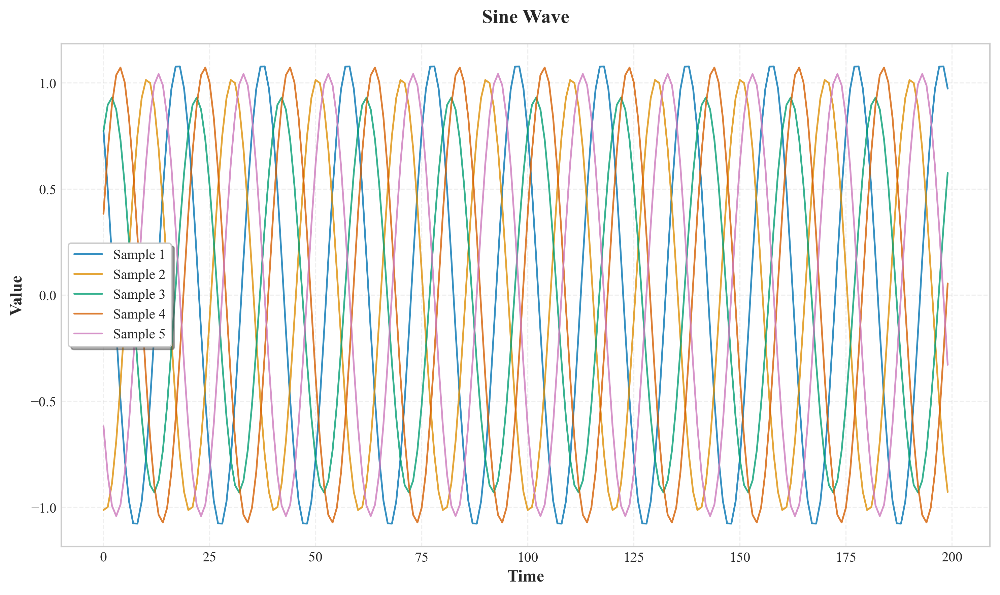

Generating and visualizing Composite Sine Wave pattern...


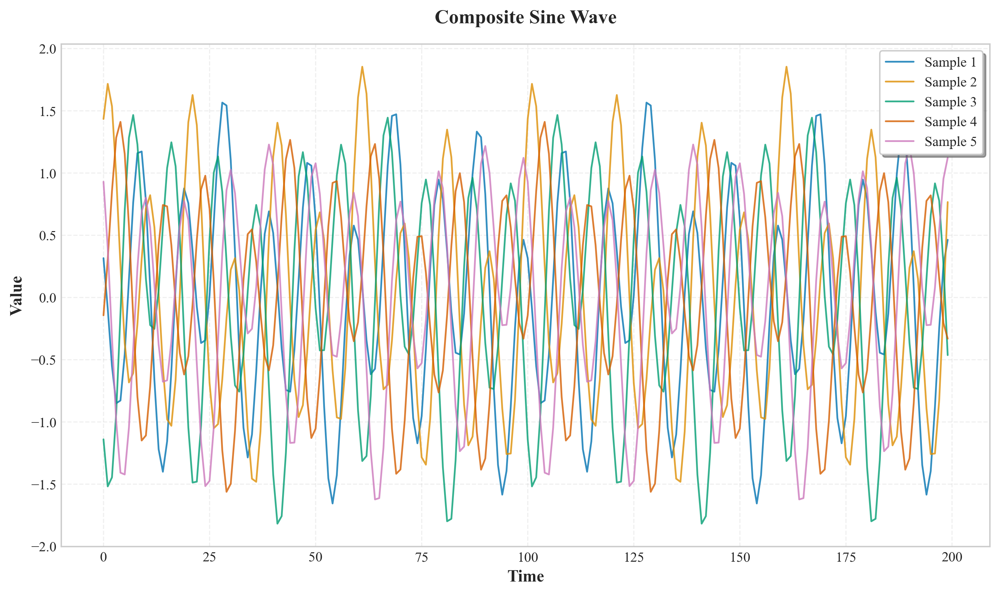

Generating and visualizing Linear Trend pattern...


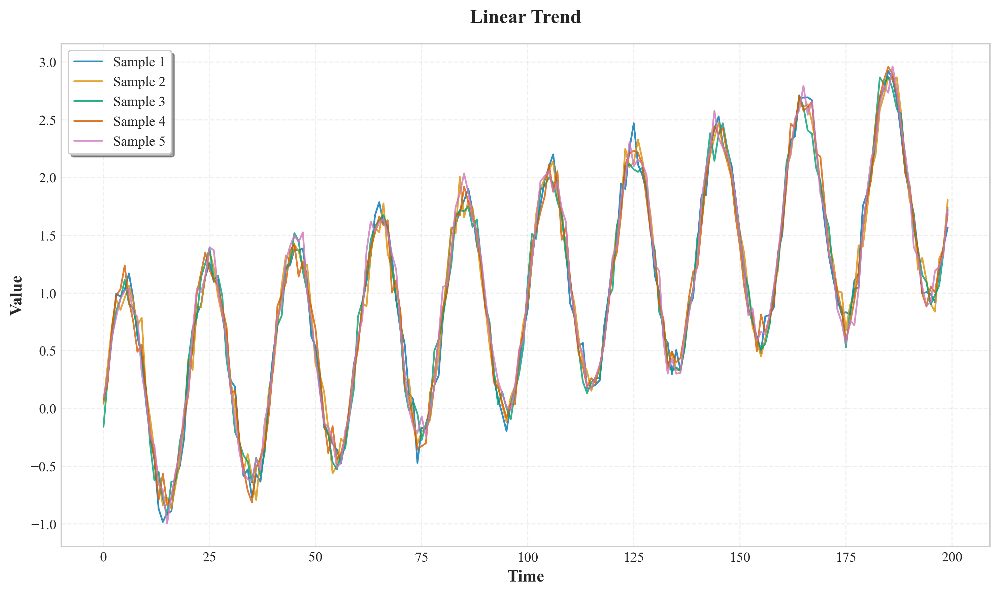

Generating and visualizing Exponential Trend pattern...


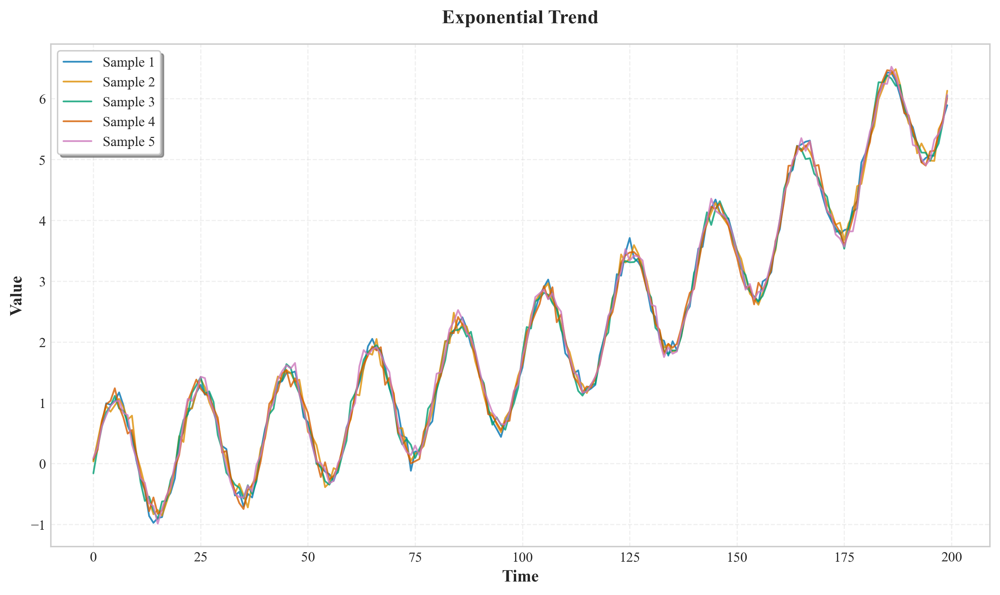

Generating and visualizing Changing Pattern pattern...


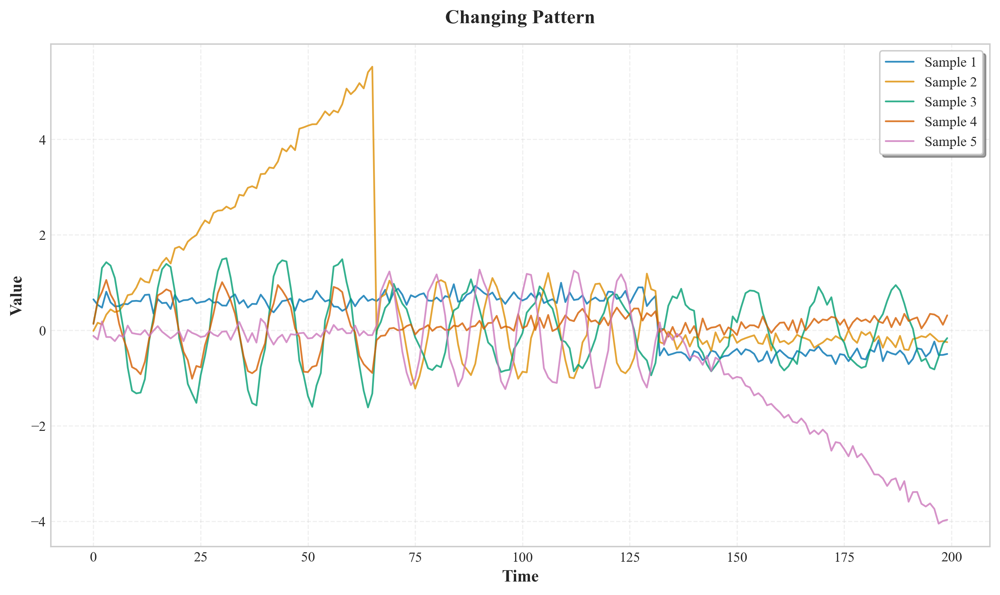

Generating and visualizing AR Nonstationary pattern...


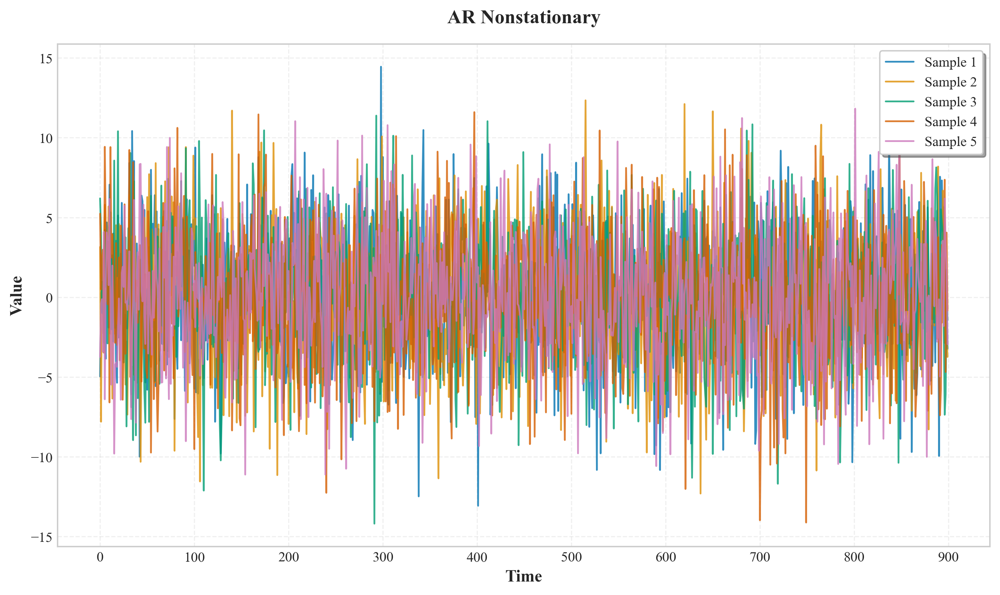

Generating and visualizing Gaussian Noise pattern...


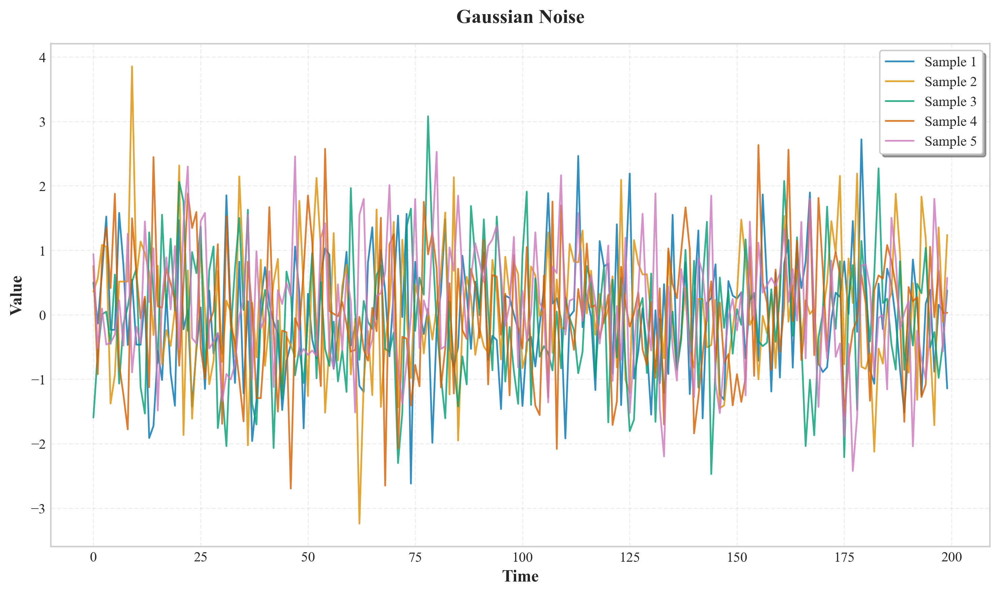

Generating and visualizing Pink Noise pattern...


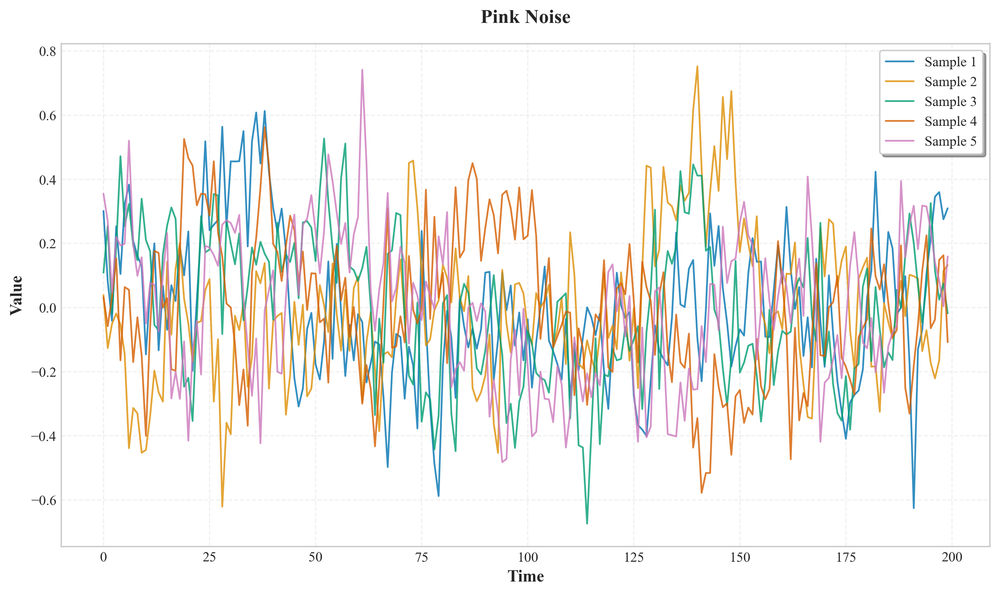

Generating and visualizing Brownian Noise pattern...


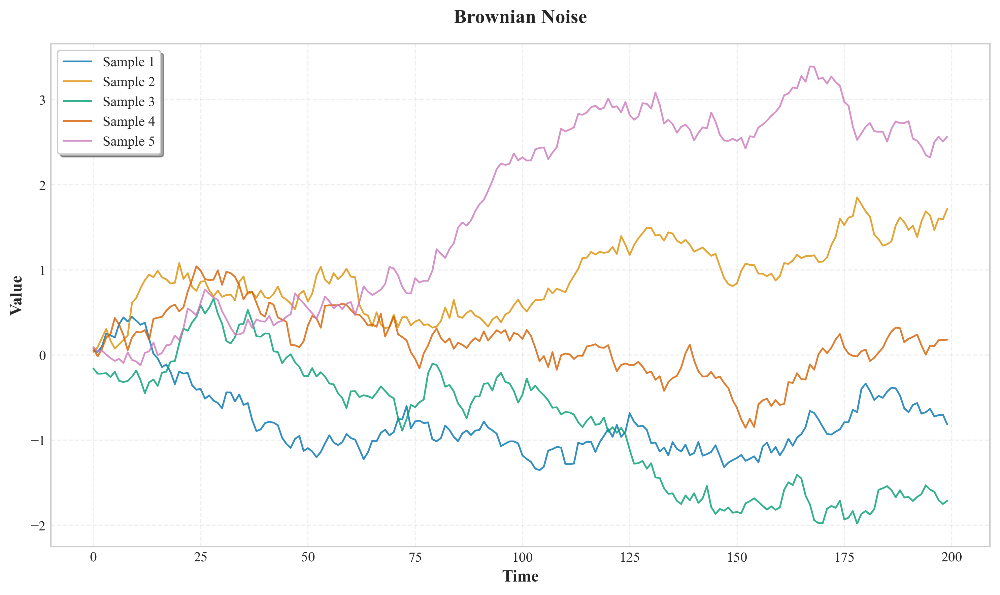

Generating and visualizing Heavy-tailed Noise pattern...


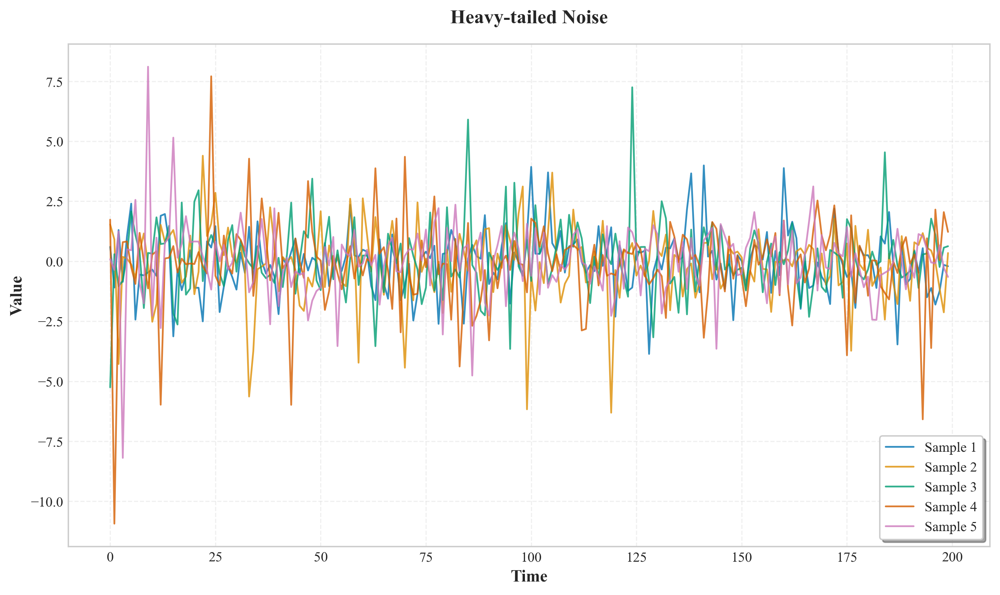

Generating and visualizing Mixed Noise pattern...


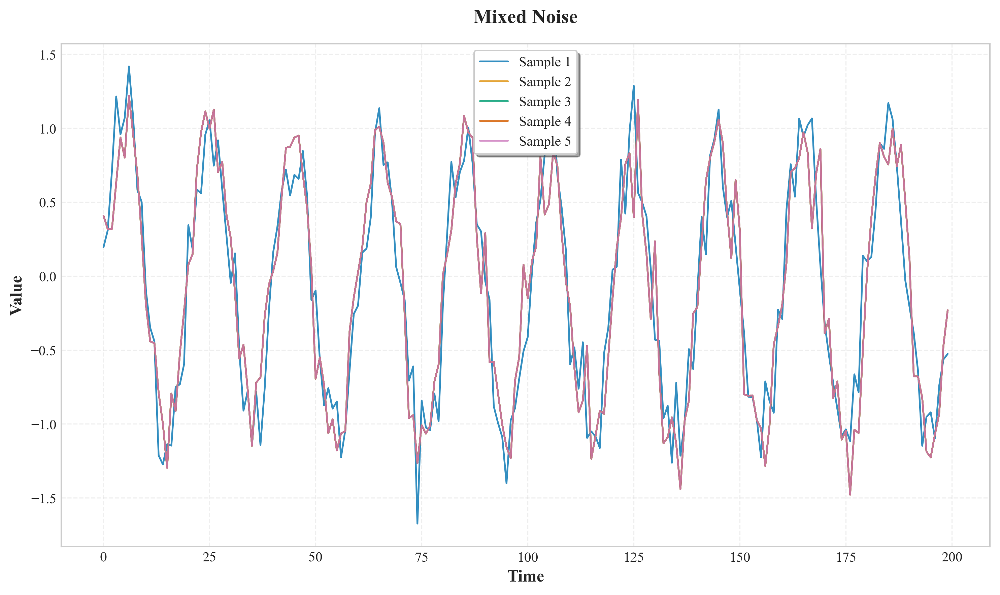

Generating and visualizing High Mean pattern...


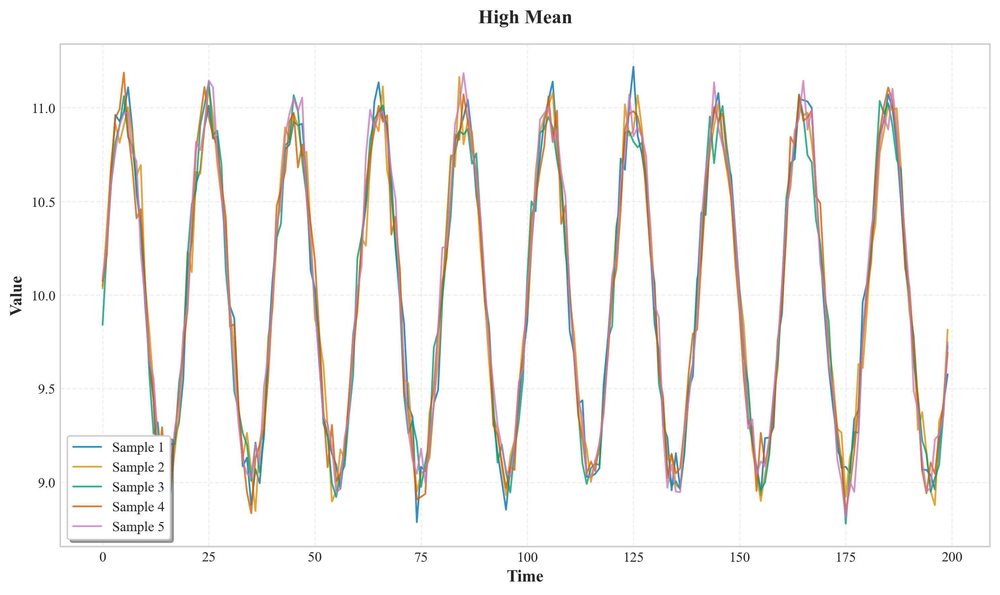

Generating and visualizing Low Mean pattern...


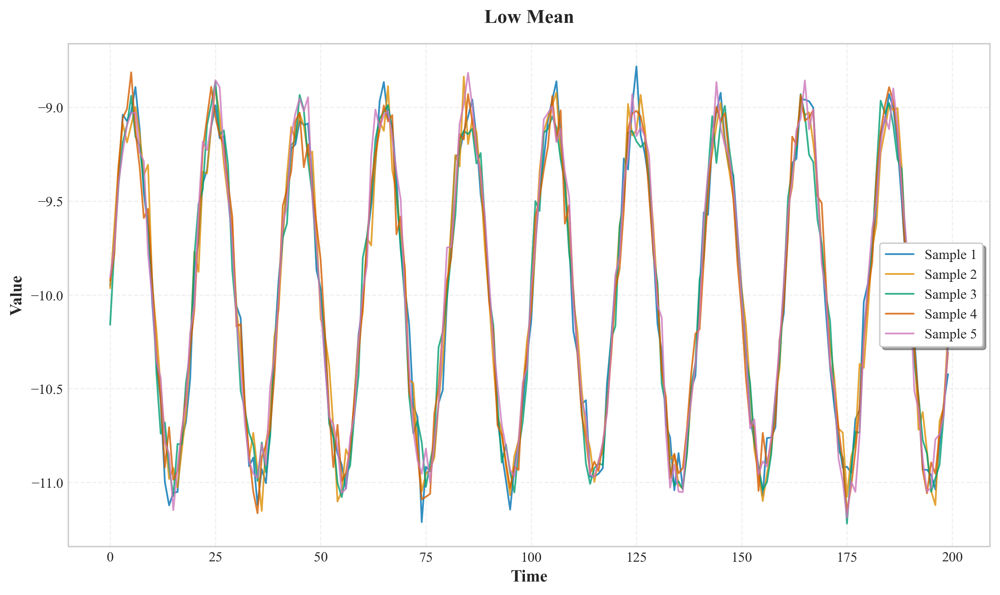

Generating and visualizing Varying Mean pattern...


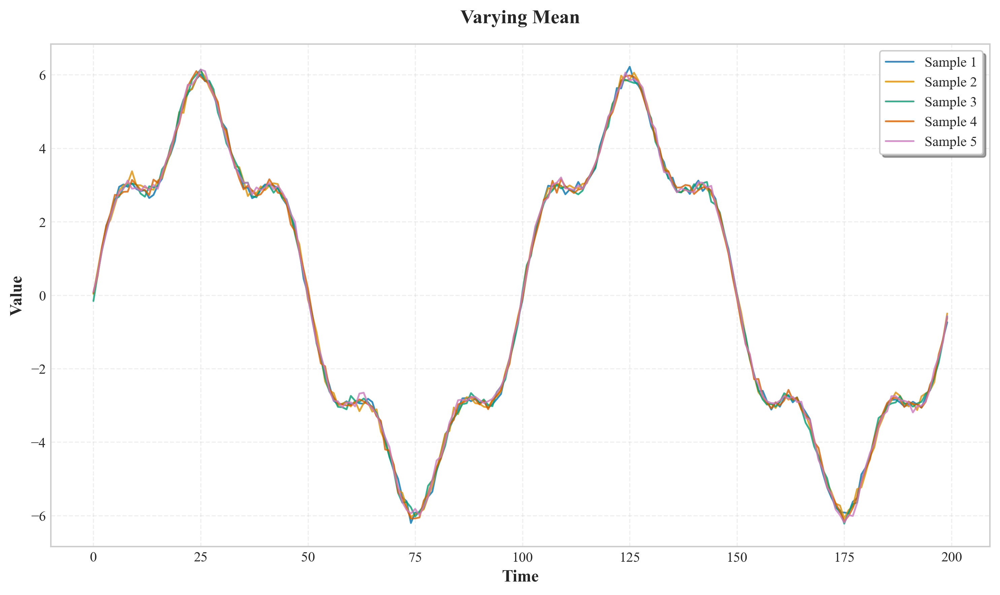

Generating and visualizing High Volatility pattern...


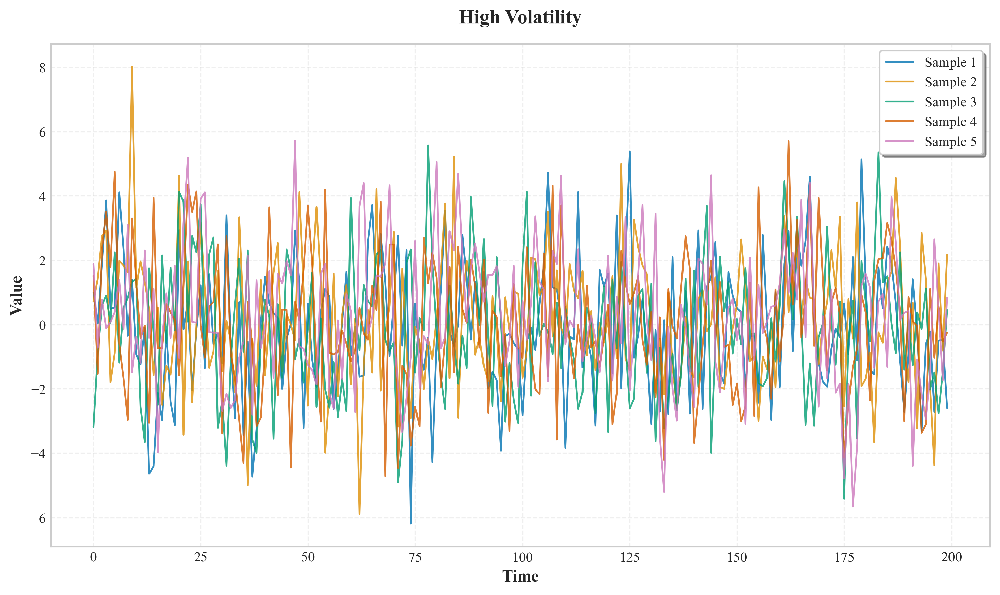

Generating and visualizing Low Volatility pattern...


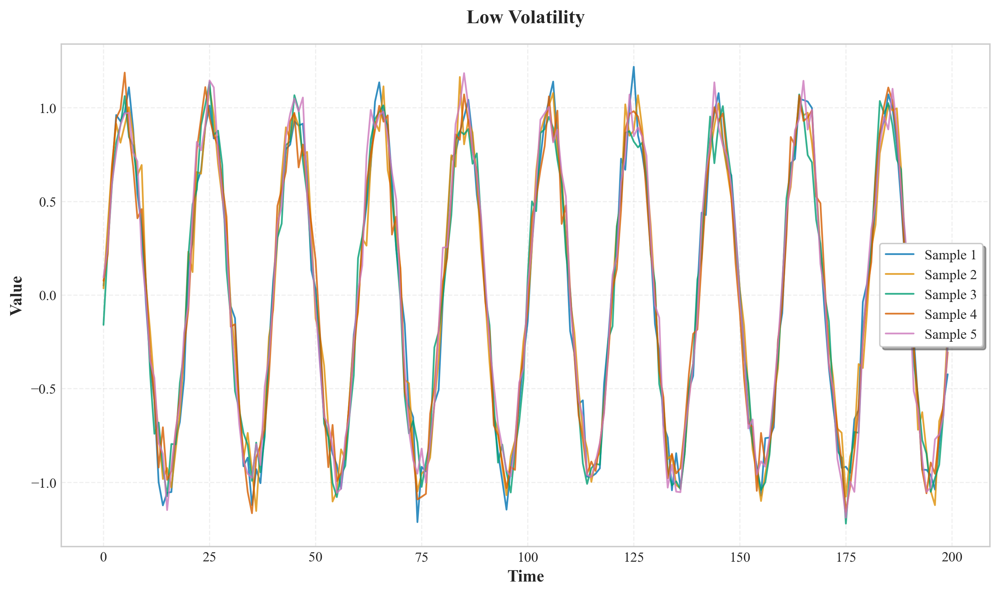

Generating and visualizing Varying Volatility pattern...


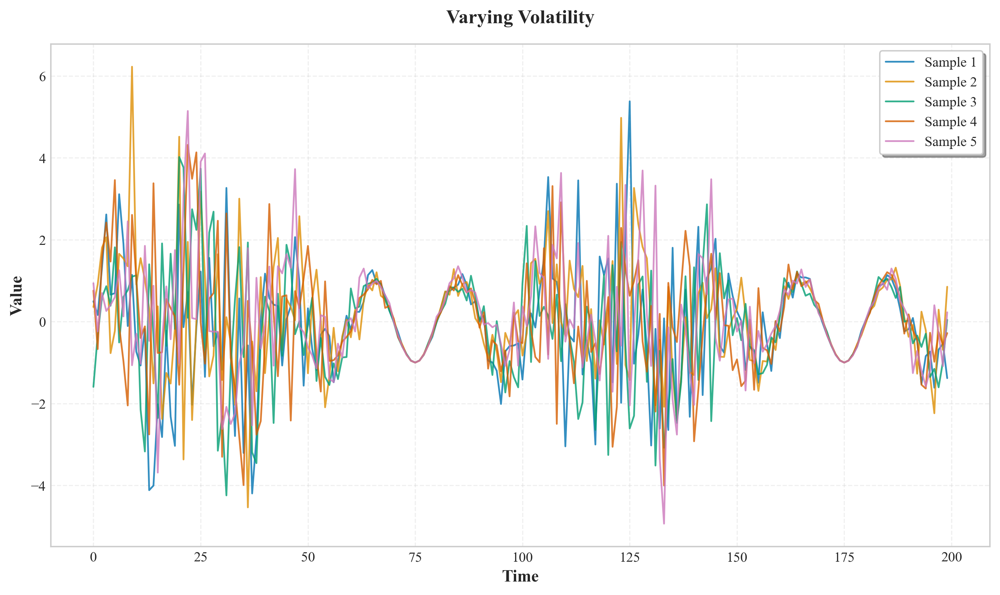

Visualization complete!


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib.ticker import MaxNLocator

# Import your synthetic data generators
from stationary import SineWaveGenerator, CompositeSineGenerator
from nonstationary import TrendGenerator, ChangingPatternGenerator, ARNonstationaryGenerator
from noise import NoiseGenerator, MixedNoiseGenerator
from statistical_patterns import VaryingMeanGenerator, VaryingVolatilityGenerator

# Set publication-quality styling
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 400
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 16

# Define a colorblind-friendly color palette
colors = [
    '#0173B2',  # blue
    '#DE8F05',  # orange
    '#029E73',  # green
    '#D55E00',  # vermillion
    '#CC78BC',  # purple
    '#CA9161',  # brown
    '#FBAFE4',  # pink
    '#949494',  # grey
    '#ECE133',  # yellow
    '#56B4E9'   # light blue
]

def plot_time_series_samples(data, num_samples=5, title="Time Series Samples",
                            figsize=(10, 6)):
    """
    Plot multiple time series samples with publication-quality styling.
    
    Args:
        data (np.ndarray): Time series data of shape (num_samples, seq_length)
        num_samples (int): Number of samples to plot
        title (str): Title for the plot
        figsize (tuple): Figure size in inches
        save_path (str): Path to save the figure, if None the figure is not saved
    """
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot each sample with a different color
    for i in range(min(num_samples, len(data))):
        ax.plot(
            data[i],
            label=f"Sample {i+1}",
            color=colors[i % len(colors)],
            linewidth=1.25,
            alpha=0.8
        )
    
    # Set title and axis labels
    ax.set_title(title, fontweight='bold', pad=15)
    ax.set_xlabel("Time", fontweight='bold')
    ax.set_ylabel("Value", fontweight='bold')
    
    # Customize grid
    ax.grid(True, linestyle='--', alpha=0.3)
    
    # Ensure x-axis shows integer ticks
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    
    # Add legend with nice formatting
    ax.legend(loc='best', frameon=True, fancybox=True, shadow=True)
    
    # Tight layout
    plt.tight_layout()
    
    # # Save if path is provided
    # if save_path:
    #     plt.savefig(save_path, bbox_inches='tight')
    #     print(f"Figure saved to {save_path}")
    
    plt.show()
    
    return fig, ax

def visualize_all_patterns(save_dir=None):
    """
    Generate and visualize samples from all available synthetic patterns.
    
    Args:
        save_dir (str): Directory to save figures. If None, figures are not saved.
    """
    # Define common parameters
    seq_length = 200
    num_samples = 5  # Generate 5 samples for each pattern
    seed = 42
    
    # List to store all generation configurations
    generators = [
        # Stationary patterns
        {
            'name': 'Sine Wave',
            'generator': SineWaveGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'freq': 0.05,
                'amplitude': 1.0,
                'seed': seed
            }
        },
        {
            'name': 'Composite Sine Wave',
            'generator': CompositeSineGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'frequencies': [0.1, 0.05, 0.02],
                'amplitudes': [1.0, 0.5, 0.25],
                'seed': seed
            }
        },
        
        # Nonstationary patterns
        {
            'name': 'Linear Trend',
            'generator': TrendGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'trend_type': 'linear',
                'seasonal_amplitude': 1.0,
                'trend_coefficient': 0.01,
                'seed': seed
            }
        },
        {
            'name': 'Exponential Trend',
            'generator': TrendGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'trend_type': 'exponential',
                'seasonal_amplitude': 1.0,
                'trend_coefficient': 0.01,
                'seed': seed
            }
        },
        {
            'name': 'Changing Pattern',
            'generator': ChangingPatternGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'change_points': 2,
                'seed': seed
            }
        },
        {
            'name': 'AR Nonstationary',
            'generator': ARNonstationaryGenerator,
            'params': {
                'seq_length': 900, 
                'num_samples': num_samples,
                'seed': seed
            }
        },
        
        # Noise patterns
        {
            'name': 'Gaussian Noise',
            'generator': NoiseGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'noise_type': 'gaussian',
                'noise_params': {'std': 1.0},
                'seed': seed
            }
        },
        {
            'name': 'Pink Noise',
            'generator': NoiseGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'noise_type': 'pink',
                'seed': seed
            }
        },
        {
            'name': 'Brownian Noise',
            'generator': NoiseGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'noise_type': 'brownian',
                'seed': seed
            }
        },
        {
            'name': 'Heavy-tailed Noise',
            'generator': NoiseGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'noise_type': 'heavy_tailed',
                'noise_params': {'df': 3},
                'seed': seed
            }
        },
        {
            'name': 'Mixed Noise',
            'generator': MixedNoiseGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'base_signal': 'sine',
                'seed': seed
            }
        },
        
        # Statistical patterns
        {
            'name': 'High Mean',
            'generator': VaryingMeanGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'mean_level': 'high',
                'seasonal': True,
                'seed': seed
            }
        },
        {
            'name': 'Low Mean',
            'generator': VaryingMeanGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'mean_level': 'low',
                'seasonal': True,
                'seed': seed
            }
        },
        {
            'name': 'Varying Mean',
            'generator': VaryingMeanGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'mean_level': 'varying',
                'seasonal': True,
                'seed': seed
            }
        },
        {
            'name': 'High Volatility',
            'generator': VaryingVolatilityGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'volatility_type': 'high',
                'seed': seed
            }
        },
        {
            'name': 'Low Volatility',
            'generator': VaryingVolatilityGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'volatility_type': 'low',
                'seed': seed
            }
        },
        {
            'name': 'Varying Volatility',
            'generator': VaryingVolatilityGenerator,
            'params': {
                'seq_length': seq_length, 
                'num_samples': num_samples,
                'volatility_type': 'varying',
                'seed': seed
            }
        }
    ]
    
    # Generate and visualize each pattern
    for config in generators:
        print(f"Generating and visualizing {config['name']} pattern...")
        
        # Instantiate generator
        generator = config['generator'](**config['params'])
        
        # Generate data
        if config['name'] == 'AR Nonstationary':
            # Special handling for ARNonstationaryGenerator which returns (data, time_features)
            data, _ = generator.generate()
        else:
            data = generator.generate()

        # Plot the data
        plot_time_series_samples(
            data=data,
            num_samples=min(5, len(data)),
            title=f"{config['name']}",
            figsize=(10, 6),
            # save_path=save_path
        )
        
    print("Visualization complete!")

if __name__ == "__main__":
    visualize_all_patterns()

In [1]:
from financial_patterns import VolatilityClusteringGenerator, JumpDiffusionGenerator, MultiSeasonalGenerator, LongMemoryGenerator, MomentumMeanReversionGenerator, RealisticMarketGenerator

def visualize_financial_patterns(save_dir=None):
    """
    Generate and visualize samples from all financial pattern generators.
    Uses the plot_time_series_samples function from visualization.py
    """
        
    def plot_time_series_samples(data, num_samples=5, title="Time Series Samples", figsize=(10, 6)):
        """Simple plotting function"""
        plt.figure(figsize=figsize)
        colors = ['#0173B2', '#DE8F05', '#029E73', '#D55E00', '#CC78BC']
        
        for i in range(min(num_samples, len(data))):
            plt.plot(data[i], label=f"Sample {i+1}", color=colors[i % len(colors)])
        
        plt.title(title, fontweight='bold')
        plt.xlabel("Time")
        plt.ylabel("Value")
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    
    # Define common parameters
    seq_length = 200
    num_samples = 5
    seed = 42
    
    # List to store all generation configurations
    generators = [
        {
            'name': 'Volatility Clustering',
            'generator': VolatilityClusteringGenerator,
            'params': {
                'seq_length': seq_length,
                'num_samples': num_samples,
                'alpha': 0.05,
                'beta': 0.85,
                'omega': 0.01,
                'mean_return': 0.0001,
                'seed': seed
            }
        },
        {
            'name': 'Jump Diffusion',
            'generator': JumpDiffusionGenerator,
            'params': {
                'seq_length': seq_length,
                'num_samples': num_samples,
                'jump_frequency': 0.015,
                'jump_size_mean': 0,
                'jump_size_std': 0.02,
                'drift': 0.0002,
                'diffusion_std': 0.01,
                'seed': seed
            }
        },
        {
            'name': 'Multi-Seasonal',
            'generator': MultiSeasonalGenerator,
            'params': {
                'seq_length': seq_length,
                'num_samples': num_samples,
                'seasons': [5, 20, 60],  # Weekly, monthly, quarterly
                'seasonal_amplitudes': [0.005, 0.01, 0.003],
                'base_volatility': 0.005,
                'seed': seed
            }
        },
        {
            'name': 'Long Memory',
            'generator': LongMemoryGenerator,
            'params': {
                'seq_length': seq_length,
                'num_samples': num_samples,
                'persistence': 0.95,
                'volatility': 0.005,
                'mean_return': 0.0001,
                'seed': seed
            }
        },
        {
            'name': 'Momentum-Mean Reversion',
            'generator': MomentumMeanReversionGenerator,
            'params': {
                'seq_length': seq_length,
                'num_samples': num_samples,
                'regime_duration': 30,
                'momentum_strength': 0.003,
                'reversion_strength': 0.003,
                'volatility': 0.01,
                'seed': seed
            }
        },
        {
            'name': 'Realistic Market',
            'generator': RealisticMarketGenerator,
            'params': {
                'seq_length': seq_length,
                'num_samples': num_samples,
                'trend_strength': 0.0001,
                'vol_cluster_strength': 0.8,
                'jump_frequency': 0.005,
                'seasonality_strength': 0.005,
                'long_memory_strength': 0.1,
                'seed': seed
            }
        }
    ]
    
    # Generate and visualize each pattern
    for config in generators:
        print(f"Generating and visualizing {config['name']} pattern...")
        
        # Instantiate generator
        generator = config['generator'](**config['params'])
        
        # Generate data
        data = generator.generate()
        
        # Plot the data
        plot_time_series_samples(
            data=data,
            num_samples=min(5, len(data)),
            title=f"{config['name']}",
            figsize=(10, 6)
        )
    
    print("Financial pattern visualization complete!")


if __name__ == "__main__":
    visualize_financial_patterns()

ImportError: attempted relative import with no known parent package